# get the document

In [1]:
%matplotlib inline
%run -i '0_paths.py'
%run -i '4_natural_language_processing.py'
initial_panel = '201908'
# doc = open_topic_df(initial_panel = initial_panel)
doc_df = combine_topics_into_pandas(initial_panel = initial_panel)
print(doc_df.shape)
print(doc_df.sample(n=10))




(11945, 1)
                                                                                                        topic_string
ru.itkey.android.xplay                    support xplay feature ndon multilingual mode medium media library language
com.SimplyEntertaining.addwatermark            watermark watermarks logo fonts form free fully gallore hundred image
com.inxile.BardTale                        bard free favorite feature features featuring forest form french facebook
com.higherone.mobile.android                     card work deal delight deposit device discount download earn easily
asl.fingerspell                              slow work way start spelling skill practice finger enjoy aslfingerspell
com.ovz.carscanner                                         car nattention work data far face extra extend etc engine
com.CactusGames.ClashOfCrimeFull                               san young free gun graphic glitz give girl ghetto gas
com.mmguardian.childapp              app nconfigure 

# TF-IDF

https://towardsdatascience.com/how-to-cluster-in-high-dimensions-4ef693bacc6

curse of high dimensionality, need to set max_feature to restrict the number of columns in tf-idf matrix.

https://blog.exploratory.io/demystifying-text-analytics-part-4-dimensionality-reduction-and-clustering-in-r-cbc8c90e0b14

As you can imagine, when you have real-world documents the number of the dimensions would increase dramatically like a few thousand because the number of the dimensions equals to the number of unique terms in the entire set of documents.
Another thing you would notice by looking at the above table is that there are many cells that are left empty because all of the terms don’t necessarily exist in all the documents. We call this type of data ‘sparse’ data or ‘sparse matrix’.
Calculating the distance among all the documents from this type of high-dimensional and sparse data with algorithms like ‘K-means’ would have a problem called ‘Curse of dimensionality’.

In [8]:
# tfidf transformation
%run -i '4_natural_language_processing.py'
pipe = Pipeline(steps = [('tfidf', TfidfVectorizer(max_features=1500))])
matrix = pipe.fit_transform(doc_df['topic_string'])
print(type(matrix))
# transform the matrix to matrix dataframe
matrix_df = pd.DataFrame(matrix.toarray(),
                         columns=pipe['tfidf'].get_feature_names())
matrix_df['app_ids'] = doc_df.index.tolist()
matrix_df.set_index('app_ids', inplace=True)
matrix_df


<class 'scipy.sparse.csr.csr_matrix'>


10   12   30   3d  \
app_ids                                                                      
com.canva.editor                                        0.0  0.0  0.0  0.0   
jp.ne.ibis.ibispaintx.app                               0.0  0.0  0.0  0.0   
com.adobe.spark.post                                    0.0  0.0  0.0  0.0   
com.sec.penup                                           0.0  0.0  0.0  0.0   
com.doodle.master.draw.glow.art                         0.0  0.0  0.0  0.0   
...                                                     ...  ...  ...  ...   
com.sparklingsocietytycoon.paradisecityislandsim        0.0  0.0  0.0  0.0   
com.budgestudios.MyLittlePonyHarmonyQuest               0.0  0.0  0.0  0.0   
com.budgestudios.googleplay.MyLittlePonyRainbowRunners  0.0  0.0  0.0  0.0   
letsfarm.com.playday                                    0.0  0.0  0.0  0.0   
com.sparklingsociety.cityisland4                        0.0  0.0  0.0  0.0   

                                                        access  account   ad  \
app_ids                                                                        
com.canva.editor                                           0.0      0.0  0.0   
jp.ne.ibis.ibispaintx.app                                  0.0      0.0  0.0   
com.adobe.spark.post                                       0.0      0.0  0.0   
com.sec.penup                                              0.0      0.0  0.0   
com.doodle.master.draw.glow.art                            0.0      0.0  0.0   
...                                                        ...      ...  ...   
com.sparklingsocietytycoon.paradisecityislandsim           0.0      0.0  0.0   
com.budgestudios.MyLittlePonyHarmonyQuest                  0.0      0.0  0.0   
com.budgestudios.googleplay.MyLittlePonyRainbowRunners     0.0      0.0  0.0   
letsfarm.com.playday                                       0.0      0.0  0.0   
com.sparklingsociety.cityisland4                           0.0      0.0  0.0   

                                                        add  adventure  alarm  \
app_ids                                                                         
com.canva.editor                                        0.0        0.0    0.0   
jp.ne.ibis.ibispaintx.app                               0.0        0.0    0.0   
com.adobe.spark.post                                    0.0        0.0    0.0   
com.sec.penup                                           0.0        0.0    0.0   
com.doodle.master.draw.glow.art                         0.0        0.0    0.0   
...                                                     ...        ...    ...   
com.sparklingsocietytycoon.paradisecityislandsim        0.0        0.0    0.0   
com.budgestudios.MyLittlePonyHarmonyQuest               0.0        0.0    0.0   
com.budgestudios.googleplay.MyLittlePonyRainbowRunners  0.0        0.0    0.0   
letsfarm.com.playday                                    0.0        0.0    0.0   
com.sparklingsociety.cityisland4                        0.0        0.0    0.0   

                                                        alert  allow  android  \
app_ids                                                                         
com.canva.editor                                          0.0    0.0      0.0   
jp.ne.ibis.ibispaintx.app                                 0.0    0.0      0.0   
com.adobe.spark.post                                      0.0    0.0      0.0   
com.sec.penup                                             0.0    0.0      0.0   
com.doodle.master.draw.glow.art                           0.0    0.0      0.0   
...                                                       ...    ...      ...   
com.sparklingsocietytycoon.paradisecityislandsim          0.0    0.0      0.0   
com.budgestudios.MyLittlePonyHarmonyQuest                 0.0    0.0      0.0   
com.budgestudios.googleplay.MyLittlePonyRainbowRunners    0.0    0.0      0.0   
letsfarm.com.playday                                    

In [3]:
# check whether the index of matrix_df matches to its topic words as the original doc_df
print('this is doc_df shape, app id and topic words:')
print(matrix_df.shape)
n = doc_df.sample(n=1).index.to_native_types()
print(n)
print(doc_df.loc[n, 'topic_string'])
print()
print('first slice out matrix_df with the index app id and transpose it')
tfidf = matrix_df.loc[n].T
print(tfidf.shape)
print()
print('then filter the column with only none-zero terms, see if this matches to doc_df')
none_zero_tfidf = tfidf.loc[(tfidf != 0).all(axis=1), :] # filter out rows containing 0s
print(none_zero_tfidf.shape)
print(none_zero_tfidf.dtypes)
print(none_zero_tfidf)
# it shows matrix_df is correct with its index (app-ids).

this is doc_df shape, app id and topic words:
(11945, 1500)
['me.rapchat.rapchat']
me.rapchat.rapchat    rap youtube eye following find filter features feature favorite facebook
Name: topic_string, dtype: object

first slice out matrix_df with the index app id and transpose it
(1500, 1)

then filter the column with only none-zero terms, see if this matches to doc_df
(9, 1)
app_ids
me.rapchat.rapchat    float64
dtype: object
app_ids    me.rapchat.rapchat
eye                  0.414587
facebook             0.304180
favorite             0.292998
feature              0.193997
features             0.265350
filter               0.362208
find                 0.233956
following            0.467285
youtube              0.370693


# SVD
https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.TruncatedSVD.html

Dimensionality reduction using truncated SVD (aka LSA).

This transformer performs linear dimensionality reduction by means of truncated singular value decomposition (SVD). Contrary to PCA, this estimator does not center the data before computing the singular value decomposition. This means it can work with sparse matrices efficiently.

## choose optimal number of components (dimensions)


Number of components = 4 and explained variance = 0.03459928330551145
Number of components = 10 and explained variance = 0.06553391533171926
Number of components = 15 and explained variance = 0.08619965999333826
Number of components = 20 and explained variance = 0.10493948263758565
Number of components = 50 and explained variance = 0.19456044346030832
Number of components = 100 and explained variance = 0.3002327273034872
Number of components = 150 and explained variance = 0.3813743197021764
Number of components = 200 and explained variance = 0.4476497953521924
Number of components = 500 and explained variance = 0.6939196266175429
Number of components = 700 and explained variance = 0.7938729007790271
Number of components = 800 and explained variance = 0.8337097106002663
Number of components = 900 and explained variance = 0.8683968335903207
Number of components = 1000 and explained variance = 0.8987100028298098
Number of components = 1100 and explained variance = 0.9252511203382449
Numb

100%|██████████| 17/17 [00:24<00:00,  1.45s/it]


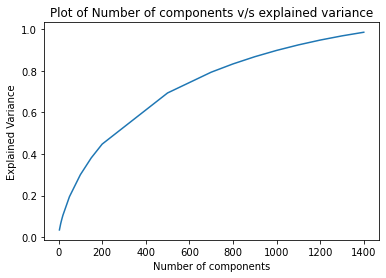

In [8]:
# skip the block if you have decided which n_comp to use
%run -i '4_natural_language_processing.py'
# https://medium.com/swlh/truncated-singular-value-decomposition-svd-using-amazon-food-reviews-891d97af5d8d
n_comp = [4,10,15,20,50,100,150,200,500,700,800,900,1000,1100,1200,1300,1400] # list containing different values of components
explained = [] # explained variance ratio for each component of Truncated SVD
for x in tqdm(n_comp):
    svd = TruncatedSVD(n_components=x)
    svd.fit(matrix)
    explained.append(svd.explained_variance_ratio_.sum())
    print("Number of components = %r and explained variance = %r"%(x,svd.explained_variance_ratio_.sum()))
plt.plot(n_comp, explained)
plt.xlabel('Number of components')
plt.ylabel("Explained Variance")
plt.title("Plot of Number of components v/s explained variance")
plt.show()

## transform tf-idf using truncated svd
From the graph above, choose 500
https://subscription.packtpub.com/book/big_data_and_business_intelligence/9781783989485/1/ch01lvl1sec21/using-truncated-svd-to-reduce-dimensionality

In [6]:
# I need to look at the source code in order to add app-id index for the transformed svd matrix
svd = TruncatedSVD(n_components=500, random_state=50) # specify random state for the results to be replicable
matrix_transformed = svd.fit_transform(matrix) # I tried to substitute matrix_df here, and got exactly same output np array as using matrix
print(matrix_transformed.shape)
print(matrix_transformed)
# transpose the matrix for fuzzy c means
matrix_transformed_T = matrix_transformed.transpose()
print(matrix_transformed_T.shape)
print(matrix_transformed_T)

(11945, 500)
[[ 0.07880376  0.11562678 -0.09087271 ... -0.0175141   0.00167625
  -0.03845099]
 [ 0.196816   -0.16259665  0.01135727 ... -0.01221242 -0.00227231
   0.01160081]
 [ 0.21406136  0.12304397  0.04432614 ...  0.01939998  0.02479463
  -0.00676629]
 ...
 [ 0.2024434   0.08197441  0.09512102 ... -0.01339774 -0.00883814
   0.0167785 ]
 [ 0.18842208  0.06587762  0.08045671 ...  0.00360576  0.00187432
   0.0035693 ]
 [ 0.22984083 -0.08806392  0.07776151 ... -0.03677289  0.02901069
  -0.01635463]]
(500, 11945)
[[ 0.07880376  0.196816    0.21406136 ...  0.2024434   0.18842208
   0.22984083]
 [ 0.11562678 -0.16259665  0.12304397 ...  0.08197441  0.06587762
  -0.08806392]
 [-0.09087271  0.01135727  0.04432614 ...  0.09512102  0.08045671
   0.07776151]
 ...
 [-0.0175141  -0.01221242  0.01939998 ... -0.01339774  0.00360576
  -0.03677289]
 [ 0.00167625 -0.00227231  0.02479463 ... -0.00883814  0.00187432
   0.02901069]
 [-0.03845099  0.01160081 -0.00676629 ...  0.0167785   0.0035693
  -0.01

In [9]:
# assume the order of index does not change, append the matrix_df index to matrix_transformed and matrix_transformed_T
matrix_transformed_df = pd.DataFrame(matrix_transformed) # do not need to assign column names because those do not correspond to each topic words (they have been transformed)
matrix_transformed_df['app_ids'] = doc_df.index.tolist()
matrix_transformed_df.set_index('app_ids', inplace=True)
matrix_transformed_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499
app_ids,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
com.canva.editor,0.078804,0.115627,-0.090873,0.003204,-0.045182,-0.080870,0.087055,-0.046610,-0.015546,0.005235,0.005971,0.057166,-0.013382,-0.001054,0.009137,-0.014598,0.002619,-0.020736,-0.001234,-0.066094,-0.002077,0.021599,0.034562,-0.057754,-0.010828,0.002927,0.070009,-0.062522,0.037114,-0.038427,-0.042312,0.040391,-0.022037,0.064812,0.051224,-0.061166,0.002773,0.002894,-0.003275,-0.028776,0.011159,0.003030,-0.021745,0.072775,0.041746,-0.042277,0.020256,-0.019508,-0.069579,-0.066248,0.036501,-0.003769,-0.032058,0.086807,-0.059832,0.093298,0.059666,0.002408,-0.014104,-0.036199,-0.063378,-0.024208,0.005761,-0.049523,-0.000486,0.029938,-0.004327,-0.001758,0.014666,0.132378,0.040652,0.059806,-0.048005,-0.033530,-0.006954,-0.027238,-0.025829,0.043133,-0.013787,-0.005770,-0.042479,-0.020338,-0.002454,0.026100,-0.000763,-0.013328,-0.015856,-0.002433,-0.053976,-0.009286,-0.015556,0.032226,0.032409,-0.025882,0.000778,-0.008536,0.001368,-0.002553,-0.033359,0.045106,0.000946,0.020094,-0.049000,-0.024915,0.020973,-0.033812,-0.056357,-0.055160,-0.003692,-0.035713,-0.087415,0.027978,0.045594,0.049300,0.024549,-0.022381,0.024946,0.033488,-0.035833,-0.014538,0.013184,0.051237,0.009550,-0.021166,0.000982,-0.013601,0.027046,-0.012886,-0.071893,-0.019620,-0.000829,-0.050747,-0.005147,0.010386,0.004185,-0.016108,-0.037564,0.029744,-0.006437,0.044653,0.022947,-0.037420,0.082816,0.034998,-0.022678,-0.066970,0.066131,-0.000695,0.008375,-0.000726,-0.044127,-0.023396,0.003121,0.045661,0.013962,-0.006147,-0.015201,-0.035431,0.006552,-0.030055,-0.007004,-0.021809,-0.034716,0.000454,0.011349,0.015

In [10]:
matrix_transformed_T_df = pd.DataFrame(matrix_transformed_T,
                                       columns = doc_df.index.tolist())
matrix_transformed_T_df

,com.canva.editor,jp.ne.ibis.ibispaintx.app,com.adobe.spark.post,com.sec.penup,com.doodle.master.draw.glow.art,com.vblast.flipaclip,com.appxstudio.smokearteffect,com.eyewind.paperone,com.magicposernew,com.redberry.glitterlips,pl.planmieszkania.android,com.adobe.creativeapps.sketch,com.brakefield.painter,anime.face.changer.cartoon.photo_editor,com.medibang.android.paint.tablet,com.axis.drawingdesk.v3,com.weddingdress.coloringbookms,truefunapps.furniture,com.ayogamez.sketchcartoon,com.cross.stitch.color.by.number,truefunapps.notebook,com.Beautytools.coloringbookms,air.com.KalromSystems.SandDrawLite,zonek.design.paintbynumbers,com.blondeagames.art.coloring.book,com.ticticgames.glitterdress,com.madcat.easyposer,com.wildDevLab.threeDLogoMaker,com.beauty.coloringdodo,rose.gold.wallpaper,com.creative.colorfit.mandala.coloring.book,com.picsart.animate,app.over.editor,com.beansprites.rainbowglittercoloringbookFREE,com.beansprites.coloringbookmermaidsFREE,com.bytestorm.artflow,udenity.draw.animals,truefunapps.minioffice,desktop.colorbynumbers.pixelmoon,com.colorbynumber.unicorn.pixel.art.panda.draw.paintbynumber,com.sweefitstudios.drawgraffiti,co.pamobile.pokemon.cardmaker,com.IngressStudio.xxxtentacion,com.PixelStudio,kenmaz.net.animemaker,com.continuum.flyermaker,com.paintart.artworkbynumbers,com.iboattech.avatar.cute,aesthetic.wallpaper,com.tattoo.maker.design.app,com.creative.Learn.to.draw.flowers,anime.face.maker.cartoon.photo_filters,com.bingzer.android.stickdraw,truefunapps.dress,com.nra.flyermaker,com.articoapps.wedraw,noirelabs.textgram,com.birthday.birthdayinvitation,splendid.postermaker.designer,com.kidspaint.kaushalmehra.drawingfun,com.objectremover.touchretouch,com.socialmedia.socialmediapostmaker,com.jdpapps.textt1,com.mark.calligraphy,ps.battle.royale,me.tomhicks.asketchaday,ice.lenor.nicewordplacer.app,com.skylapcity.photocollage,com.beautywall.superheroes.wallpaper,com.samsung.android.sdrawing,com.sorincovor.pigments,com.phone.launcher.lite,com.brakefield.idfree,provapi.wallpaper.xxxtentacion,com.abcgamescom.generator.ides.drawing,udenity.draw.weapons,com.vehicledrawingbook.android,com.e3games.numbercoloring.pixelart,com.ova.studio.anime.wallpaper,com.tophatch.concepts,com.ouhmaexe.wallwovers,anime.smartroom.com.drawanime,osmandroid.a8bitpainter,com.wallpapers.anime.song.xxxtentaction,com.iboattech.avatar.factory,app.poster.maker.postermaker.flyer.designer,com.optimumbrewlab.invitationcardmaker,com.devloperpro.creepypastawallpaper,com.piupiuapps.coloringmandala3,com.fashion.tattoo.name.my.photo.editor,com.camera.sketch.camera.pencil,com.HousePlanDesigns.sitd212,com.figuromo.colorminiscollections,truefunapps.food,com.teazel.coloring,com.sweefitstudios.drawgraffiticharacters,com.laura.fashiondesign,com.ioslauncher.newest,com.iphone.xs.launcher.ios12.theme,com.vn.goforoid.wallpaper.galaxy,com.google.android.projection.gearhead,com.cars.android,com.aa.extreme.city.gt.car.stunts,com.carmax.carmax,com.autolist.autolist,com.paybyphone,tat.example.ildar.seer,com.destotechgames.animal.rescue.atv.trolly,com.carvana.carvana,com.gs360.counter.terrorist.shooting.games,com.driveus.dmvapp,com.ggs.offroadjeep.mountaindriving.racingsimulator.games,com.fair.fairapp,com.coco.dmv,com.shell.sitibv.motorist.america,com.impp.city.traindriver.simulator,dto.ee.dmv.genius,com.coco.cdl,com.gb.truckdriving.heavytruck.drivinggames.drivingsimulator,com.gzl.drivebus.parking.game,com.drivetime.MobileOnline,com.gpshopper.discounttire,com.rr.waterstunts.bikeracing.beachbike.motorbikegames,com.jimaapps.city.coach.bus.simulator.driving,com.autopten.cheapcarsforsale,com.ovz.carscanner,com.rcgames.megarampstunts,com.ramp.bike.impossible.bike.racing.stunt.games,com.gp.crazy.tricky.bike.stunt.drift,com.gameswing.impossibletracks.stuntdriving.simulator2,com.impp.construction.simulator.forklift,com.driveoctane.app,com.ifg.carrepair.carbuilder.garagesimulator.workshoprepair,com.szinteractive.TrafficRace,com.saritasa.micromechanic,com.impp.citytaxi.simulator.driv

# kmeans

## skip below if you have already chosen the optimal number of clusters

In [20]:
# https://medium.com/@MSalnikov/text-clustering-with-k-means-and-tf-idf-f099bcf95183
# https://pythonprogramminglanguage.com/kmeans-text-clustering/
# https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html
# 2018 Fall machine learning I Homework 5

# n_init: int, Number of time the k-means algorithm will be run with different
# centroid seeds. default=10
# ‘k-means++’ : selects initial cluster centers for k-mean clustering in a smart way
# to speed up convergence.
# random_state: int, RandomState instance, default=None
# Determines random number generation for centroid initialization.
# Use an int to make the randomness deterministic.
# max_iter: int, default=300
# Maximum number of iterations of the k-means algorithm for a single run.
# one iteration means you calculate the distance to initially assigned /
# previously calculated centroid, and update label
%run -i '4_natural_language_processing.py'
wcss=[]
for i in tqdm(range(10,50)):
     kmeans = KMeans(n_clusters=i, init ='k-means++', random_state=0 )
     # the column of matrix (each unique word) is a feature
     # here we only fit, not predict because we want to find the optimal number of centers
     # through elbow method, and then use that for fit_predict command
     kmeans.fit(matrix_transformed)
     wcss.append(kmeans.inertia_)

100%|██████████| 40/40 [02:11<00:00,  3.29s/it]


<Figure size 432x288 with 0 Axes>

In [21]:
# save
initial_panel = '201908'
folder_name = initial_panel + '_PANEL_DF'
f_name = 'kmeans_tf_idf_10_101_centroids_inertia.pkl'
q = input_path / '__PANELS__' / folder_name / f_name
with open(q, 'wb') as f:
    pickle.dump(wcss, f)

## choose optimal number of clusters using elbow graph

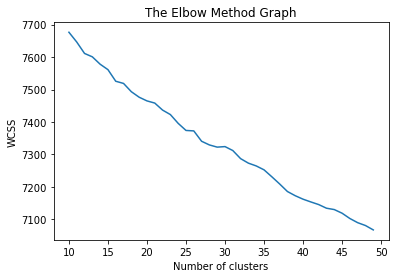

In [22]:
with open(q, 'rb') as f:
    wcss = pickle.load(f)
# https://medium.com/pursuitnotes/k-means-clustering-model-in-6-steps-with-python-35b532cfa8ad
plt.plot(range(10,50),wcss)
plt.title('The Elbow Method Graph')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()


## predict clusters for each app's description (10 topic words)
from above, choose n_clusters as 37 because as see the line drops sharply right before that.

In [13]:
kmeans = KMeans(n_clusters=37, init ='k-means++',random_state=0 )
y_kmeans = kmeans.fit_predict(matrix_transformed) # put matrix_transformed_df here would generate same result as put matrix_transformed
print(len(y_kmeans))
print(set(y_kmeans))

11945
{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36}


In [18]:
%run -i '4_natural_language_processing.py'
# attach app ids to each point and see which cluster they belong to
app_ids = matrix_transformed_df.index.tolist()
predicted_cluster_app_ids = merge_lists_to_dataframe(appid = app_ids,
                                                     cluster_label = y_kmeans,
                                                     type_of_cluster = 'k-means')
print(predicted_cluster_app_ids.shape)
predicted_cluster_app_ids


(11945, 1)


,k-means
app_id,
com.canva.editor,15
jp.ne.ibis.ibispaintx.app,18
com.adobe.spark.post,12
com.sec.penup,32
com.doodle.master.draw.glow.art,13
...,...
com.sparklingsocietytycoon.paradisecityislandsim,13
com.budgestudios.MyLittlePonyHarmonyQuest,13
com.budgestudios.googleplay.MyLittlePonyRainbowRunners,36


In [22]:
# open the original dataframe, and create a new column storing k-means labels
%run -i '4_natural_language_processing.py'
df2 = add_cluster_label_to_df(initial_panel = '201908', merged_df = predicted_cluster_app_ids)
df2.sample(n=1)

,description_201908,description_201912,description_202001,description_202003,description_202004,description_202009,description_202010,description_202011,combined_panels_description,topic_words,k-means
com.devolver.reignsGot,[available],"[reigns, game, throne, heir, award, win, hbo, tv, series, game, throne, smash, hit, swipe, -PRON-, series, reigns, nerial, devolver, digital, fiery, vision, melisandre, claim, iron, throne, cersei, lannister, jon, snow, daenerys, targaryen, carefully, navigate, complex, relationship, hostile, faction, seven, kingdom, employ, ruthless, tactic, outwit, political, rival, wield, impervious, charm, fickle, bannerman, maintain, balance, favor, people, extend, reign, maybe, day, survive, horror, coming, winter.\na, formidable, cast, rule, iron, throne, cersei, lannister, jon, snow, daenerys, targaryen, tyrion, lannister, sansa, stark, change, king, queen, unlock, face, challenge, mystery, unique, story.\nimpose, swipe, leave, right, change, fate, seven, kingdom, forever, hear, impassioned, plea, unpredictable, demand, ...]","[reigns, game, throne, heir, award, win, hbo, tv, series, game, throne, smash, hit, swipe, -PRON-, series, reigns, nerial, devolver, digital, fiery, vision, melisandre, claim, iron, throne, cersei, lannister, jon, snow, daenerys, targaryen, carefully, navigate, complex, relationship, hostile, faction, seven, kingdom, employ, ruthless, tactic, outwit, political, rival, wield, impervious, charm, fickle, bannerman, maintain, balance, favor, people, extend, reign, maybe, day, survive, horror, coming, winter.\na, formidable, cast, rule, iron, throne, cersei, lannister, jon, snow, daenerys, targaryen, tyrion, lannister, sansa, stark, change, king, queen, unlock, face, challenge, mystery, unique, story.\nimpose, swipe, leave, right, change, fate, seven, kingdom, forever, hear, impassioned, plea, unpredictable, demand, ...]","[reigns, game, throne, heir, award, win, hbo, tv, series, game, throne, smash, hit, swipe, -PRON-, series, reigns, nerial, devolver, digital, fiery, vision, melisandre, claim, iron, throne, cersei, lannister, jon, snow, daenerys, targaryen, carefully, navigate, complex, relationship, hostile, faction, seven, kingdom, employ, ruthless, tactic, outwit, political, rival, wield, impervious, charm, fickle, bannerman, maintain, balance, favor, people, extend, reign, maybe, day, survive, horror, come, winter, formidable, cast, rule, iron, throne, cersei, lannister, jon, snow, daenerys, targaryen, tyrion, lannister, sansa, stark, change, king, queen, unlock, face, challenge, mystery, unique, story, impose, swipe, leave, right, change, fate, seven, kingdom, forever, hear, impassioned, plea, unpredictable, ...]","[reigns, game, throne, heir, award, win, hbo, tv, series, game, throne, smash, hit, swipe, -PRON-, series, reigns, nerial, devolver, digital, fiery, vision, melisandre, claim, iron, throne, cersei, lannister, jon, snow, daenerys, targaryen, carefully, navigate, complex, relationship, hostile, faction, seven, kingdom, employ, ruthless, tactic, outwit, political, rival, wield, impervious, charm, fickle, bannerman, maintain, balance, favor, people, extend, reign, maybe, day, survive, horror, come, winter, formidable, cast, rule, iron, throne, cersei, lannister, jon, snow, daenerys, targaryen, tyrion, lannister, sansa, stark, change, king, queen, unlock, face, challenge, mystery, unique, story, impose, swipe, leave, right, change, fate, seven, kingdom, forever, hear, impassioned, plea, unpredictable, ...]","[reigns, game, throne, heir, award, win, hbo, tv, series, game, throne, smash, hit, swipe, -PRON-, series, reigns, nerial, devolver, digital, fiery, vision, melisandre, claim, iron, throne, cersei, lannister, jon, snow, daenerys, targaryen, carefully, navigate, complex, relationship, hostile, faction, seven, kingdom, employ, ruthless, tactic, outwit, political, rival, wield, impervious, charm, fickle, bannerman, maintain, balance, favor, people, extend, reign, maybe, d

## look at which apps are contained in each cluster (to check)

In [24]:
# filter column topic_words and k-means for the same cluster number, and manually check
%run -i '4_natural_language_processing.py'
df = select_cluster_labels(initial_panel = '201908',
                           cluster_col_name = 'k-means',
                           cluster_label_value = 7)
print(df.shape)
df.sample(n=10) # even though some are about photo printing, but looks like they are about travel


(147, 2)


,topic_words,k-means
com.meamobile.picdrop,"[photo, nprint, walmart, know, gift, good, google, hear, high, hour]",7
uk.co.mxdata.parismetro,"[metro, nwe, zoom, know, hamburg, head, hear, help, href, include]",7
com.nodtosleep.app,"[sleep, nactivity, write, friendly, hundred, hour, help, hear, head, grow]",7
com.meamobile.photoprintsnow,"[print, yes, mea, genuine, gimmick, glorious, good, google, greeting, hear]",7
com.shaka.guide.big.island,"[tour, nthe, nget, nthis, hear, hawaiian, hawaii, have, hamakua, gps]",7
com.sonypicturestelevision.jeopardy2,"[trivia, www, hear, handy, hand, grow, good, globe, geography, gameplay]",7
github.popeen.dsub,"[server, work, free, include, import, hear, gplv3, gain, from, formats]",7
com.noodlecake.reallybadchess,"[chess, whats, zach, hear, interested, instead, include, improve, idea, hope]",7
com.traverous,"[traverous, from, hiker, hear, h3, h2, h1, great, gp, gallery]",7
com.actiontourguide.freedomtrail,"[boston, ncambridges, year, hear, harvard, harborwalk, harbor, hall, guides, guide]",7


## visualizing the clusters
x-axis is the first column in matrix_transoformed, y-axis is the second column in matrix_transformed.
using the filter [] to get the entry which has y label == 0 through 36.

https://medium.com/pursuitnotes/k-means-clustering-model-in-6-steps-with-python-35b532cfa8ad

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

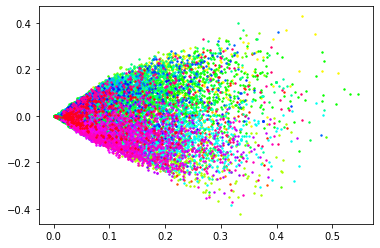

In [27]:
cluster_lables = list(set(y_kmeans))
def get_cmap(n, name='hsv'):
    '''Returns a function that maps each index in 0, 1, ..., n-1 to a distinct
    RGB color; the keyword argument name must be a standard mpl colormap name.'''
    return plt.cm.get_cmap(name, n)
cmap = get_cmap(len(cluster_lables))
for i in range(len(cluster_lables)):
    plt.scatter(matrix_transformed[y_kmeans==cluster_lables[i], 0],
                matrix_transformed[y_kmeans==cluster_lables[i], 1],
                s=2, c=cmap(i), label =str(cluster_lables[i]))

## assess the k-mean algorithm
https://scikit-learn.org/stable/modules/generated/sklearn.metrics.adjusted_rand_score.html

in order to use rand index score, one has to have true labels, which I do not have. So I will just eyeball the results.

https://stackoverflow.com/questions/37842165/sklearn-calculating-accuracy-score-of-k-means-on-the-test-data-set

In terms of evaluating accuracy. You should remember that k-means is not a classification tool, thus analyzing accuracy is not a very good idea. You can do this, but this is not what k-means is for. It is supposed to find a grouping of data which maximizes between-clusters distances, it does not use your labeling to train. Consequently, things like k-means are usually tested with things like RandIndex and other clustering metrics. For maximization of accuracy you should fit actual classifier, like kNN, logistic regression, SVM, etc.

# Fuzzy C Means
use the transform matrix from truncated svd

https://www.kaggle.com/prateekk94/fuzzy-c-means-clustering-on-iris-dataset


In [4]:
# https://scikit-fuzzy.readthedocs.io/en/latest/auto_examples/plot_cmeans.html
# https://github.com/scikit-fuzzy/scikit-fuzzy/blob/master/skfuzzy/cluster/_cmeans.py
def get_cmap(n, name='hsv'):
    '''Returns a function that maps each index in 0, 1, ..., n-1 to a distinct
    RGB color; the keyword argument name must be a standard mpl colormap name.'''
    return plt.cm.get_cmap(name, n)

## graph clusters according to different number of centers (in group of six per page)

In [5]:
# define groups of six for number of centers
groups_of_six_start = (11, 17, 23, 29, 35, 41, 47)
groups_of_six_end = (16, 22, 28, 34, 40, 46, 52)

100%|██████████| 6/6 [00:02<00:00,  2.34it/s]


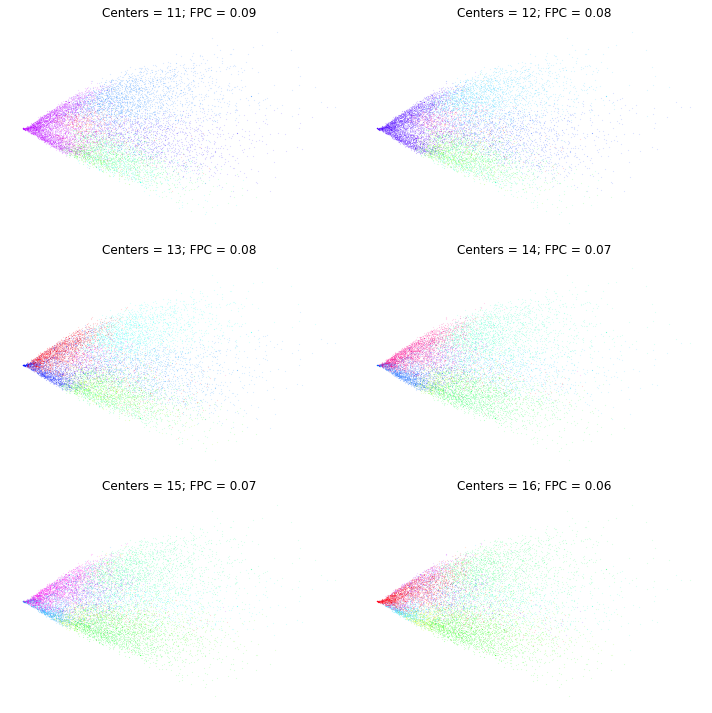

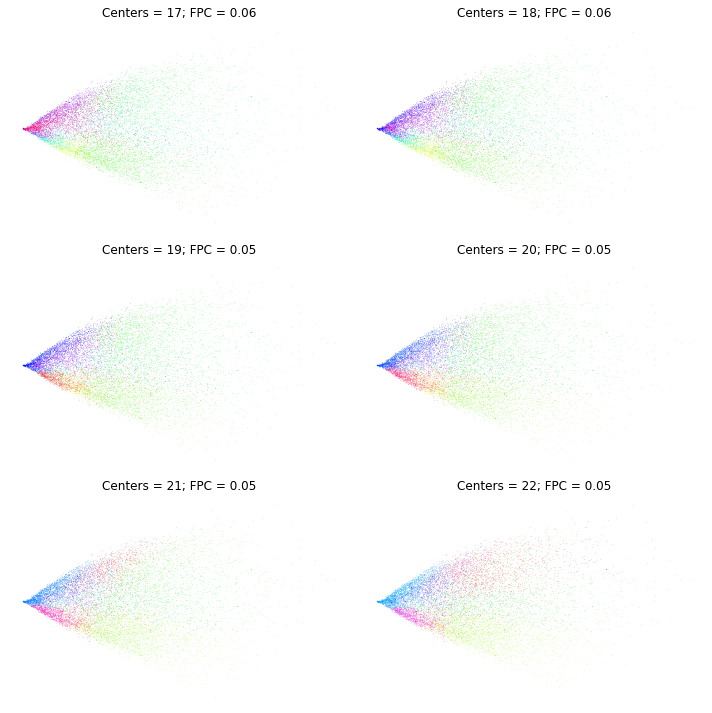

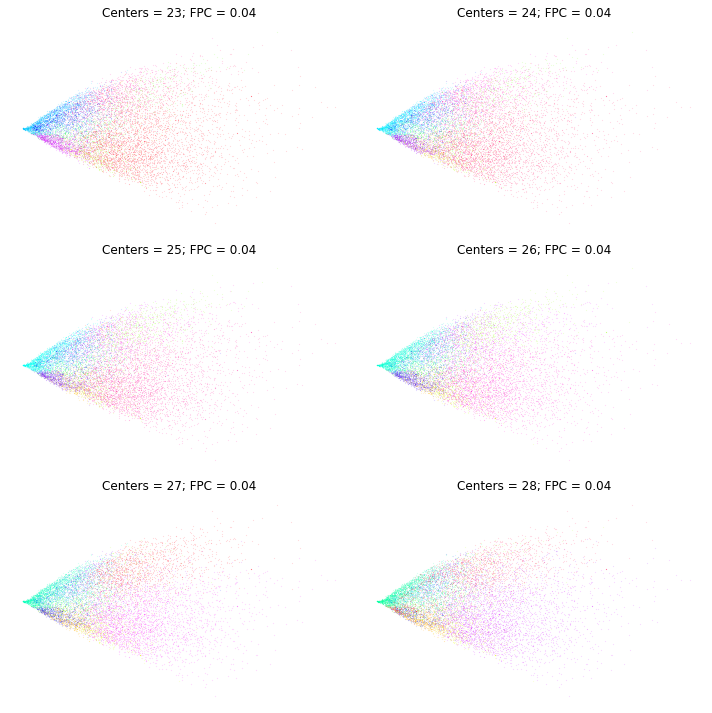

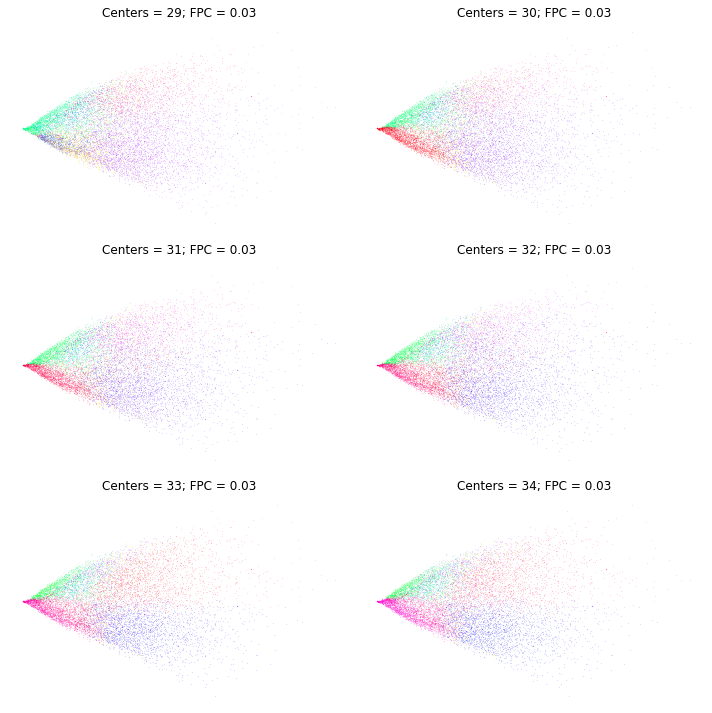

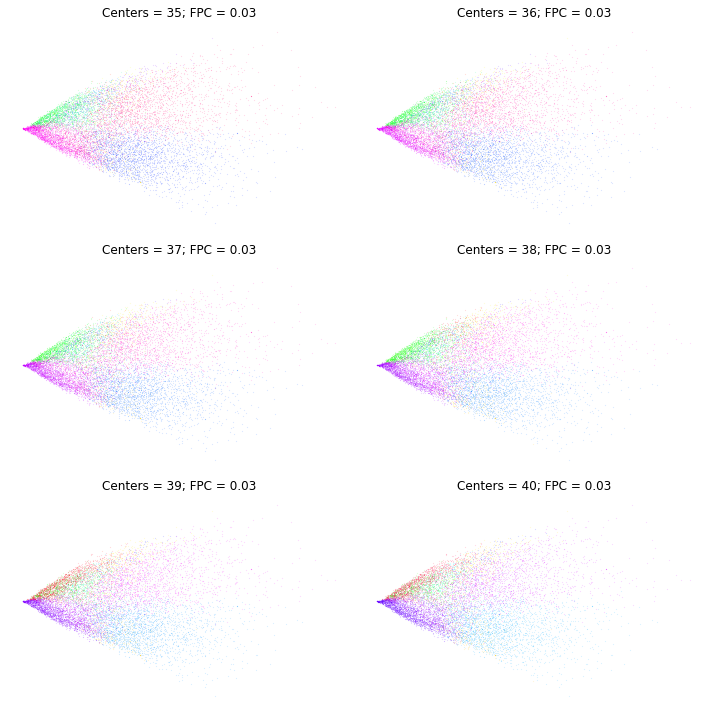

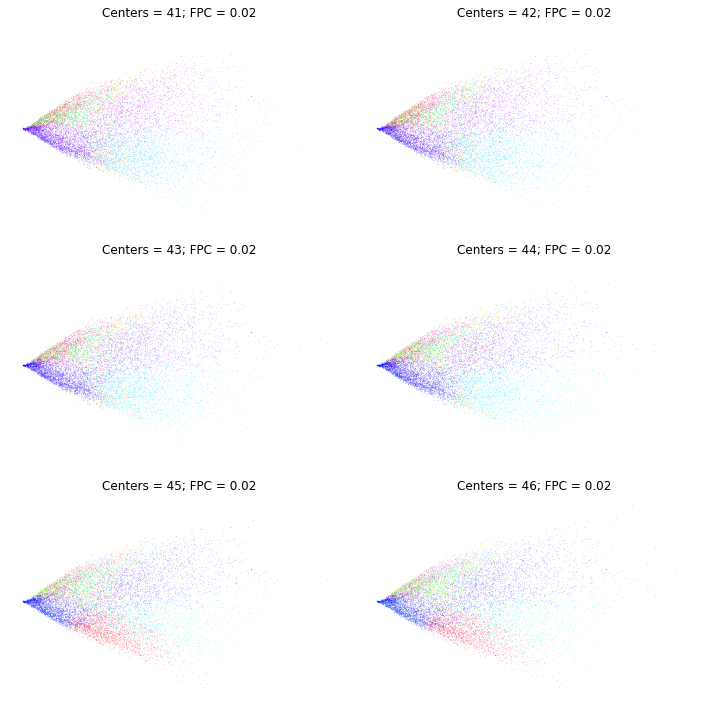

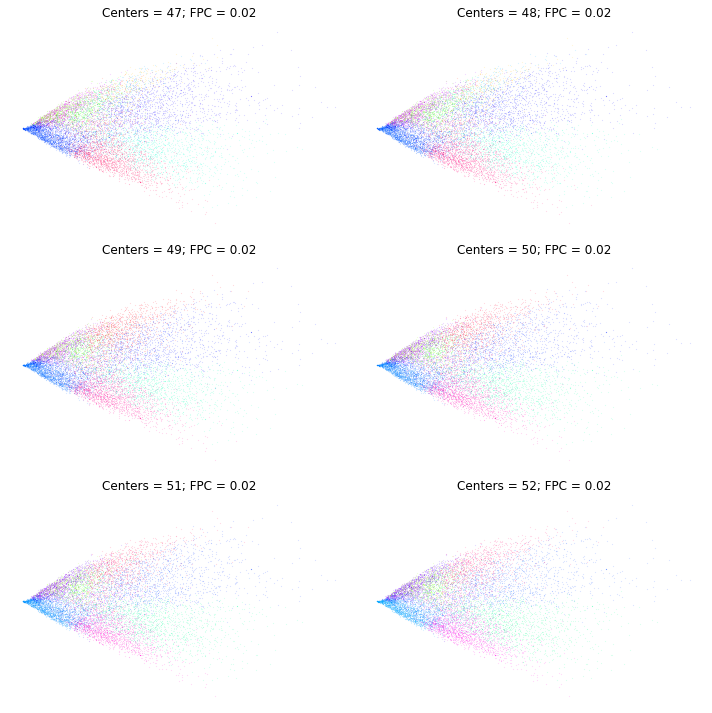

In [6]:
fpcs = []

for z in range(len(groups_of_six_start)):
    fig1, axes1 = plt.subplots(3, 2, figsize=(10,10))
    for ncenters, ax in tqdm(enumerate(axes1.reshape(-1), groups_of_six_start[z]), total=6):
        # Now trying to reshape with (-1) . it returns a flat numpy array
        # second argument means the enumerate index starts at 10
        cmap = get_cmap(ncenters)
        cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
            matrix_transformed_T, ncenters, 2, error=0.005, maxiter=500, seed=0)
        # Store fpc values for later
        fpcs.append(fpc)

        # Plot assigned clusters, for each data point in training set
        cluster_membership = np.argmax(u, axis=0)
        for j in range(ncenters):
            ax.plot(matrix_transformed_T[0, cluster_membership == j], # x-axis: feature no.1 is the first row
                    matrix_transformed_T[1, cluster_membership == j], # y-axis: feature no.2 is the second row
                    '.', markersize = 0.1, color=cmap(j))

        # Mark the center of each fuzzy cluster
        # for pt in cntr:
        #     ax.plot(pt[0], pt[1], 'rs')

        ax.set_title('Centers = {0}; FPC = {1:.2f}'.format(ncenters, fpc))
        ax.axis('off')

    # save
    initial_panel = '201908'
    folder_name = initial_panel + '_PANEL_DF'
    f_name = 'fuzzy_c_means_clusters_' + str(groups_of_six_start[z]) + '_' + str(groups_of_six_end[z]) + '.pdf'
    q = input_path / '__PANELS__' / folder_name / 'NLP_graphs'/ f_name
    fig1.savefig(q)
    fig1.tight_layout()


## Fuzzy Partition Coefficient (FPC)
https://pythonhosted.org/scikit-fuzzy/auto_examples/plot_cmeans.html#example-plot-cmeans-py

The FPC is defined on the range from 0 to 1, with 1 being best. It is a metric which tells us how cleanly our data is described by a certain model. Next we will cluster our set of data - which we know has three clusters - several times, with between 2 and 9 clusters. We will then show the results of the clustering, and plot the fuzzy partition coefficient. When the FPC is maximized, our data is described best.

Text(0, 0.5, 'Fuzzy partition coefficient')

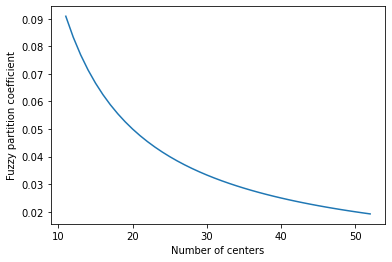

In [8]:
fig2, ax2 = plt.subplots()
ax2.plot(np.r_[11:53], fpcs)
ax2.set_xlabel("Number of centers")
ax2.set_ylabel("Fuzzy partition coefficient")

## look at the probability of a data point belonging to a cluster

np.argmax Returns the indices of the maximum values along an axis.
Here is the maximum probability.
Axis = 0 代表 going down the rows, 就比如第一个 column, 代表一个数据点 (an app's description),
第一列的每一行代表这个数据点 belong to this cluster 的 probability,
argmax return the INDEX of the maximum probability. Row index number 同时对应 cluster's numerical label.

In [7]:
print(u.shape)
print(u)
cluster_membership = np.argmax(u, axis=0)
print(len(cluster_membership))
print(cluster_membership)
# check
# for i in range(len(cluster_membership)):
#     print(u[cluster_membership[i], i])

(52, 11945)
[[0.01923076 0.01923078 0.01923076 ... 0.01923075 0.01923076 0.01923076]
 [0.01923083 0.01923074 0.01923079 ... 0.01923077 0.01923078 0.01923074]
 [0.0192308  0.01923076 0.01923078 ... 0.01923077 0.01923077 0.01923076]
 ...
 [0.01923076 0.01923079 0.01923076 ... 0.01923078 0.01923076 0.01923078]
 [0.01923074 0.01923079 0.01923077 ... 0.01923078 0.01923077 0.01923079]
 [0.01923076 0.01923077 0.01923078 ... 0.01923078 0.01923077 0.01923079]]
11945
[38 22 32 ... 32 32 22]


我们感兴趣的是一个数据点是否在很多个 cluster 里面都有较高的 probability, 这样的数据点就可以被定义为 broad app. 反之，
当一个数据点只有在一个 cluster 里面的概率超高，在其他 cluster 里面的概率超低，它就可以被定义为 niche product.
在两个极端之间的就是中间类产品，这个应该是一个 continuous 的 scale. 现在需要验证一下我的想法。 既然没一列的数据就是一个产品在各个 cluster 的概率，
我们只需要一个 measure of concentration of the data 就可以了。

1. variance: niche product tend to have higher variance while the broad product tend to have lower variance
because of the probabilities are more or less equal across clusters.

In [10]:
# use variance
# high variance, niche product; low variance, broad product
u_var = np.var(u, axis=0)
print(u_var.shape)
print(u_var)

(11945,)
[3.07787679e-15 1.37710295e-15 8.37317648e-16 ... 1.11765356e-15
 7.44916785e-16 1.72349133e-15]


match the columns to app ids

# key function documentation

In [ ]:
# https://github.com/scikit-fuzzy/scikit-fuzzy/blob/master/skfuzzy/cluster/_cmeans.py
def cmeans(data, c, m, error, maxiter,
           metric='euclidean',
           init=None, seed=None):
    """
    Fuzzy c-means clustering algorithm [1].
    Parameters
    ----------
    data : 2d array, size (S, N)
        Data to be clustered.  N is the number of data sets; S is the number
        of features within each sample vector.
        ## NAIXIN: BEAWARE, this is different from kmeans, where S is the number of data points and N is the number of features.
    c : int
        Desired number of clusters or classes.
    m : float
        Array exponentiation applied to the membership function u_old at each
        iteration, where U_new = u_old ** m.
    error : float
        Stopping criterion; stop early if the norm of (u[p] - u[p-1]) < error.
    maxiter : int
        Maximum number of iterations allowed.
    metric: string
        By default is set to euclidean. Passes any option accepted by
        ``scipy.spatial.distance.cdist``.
    init : 2d array, size (c, N)
        Initial fuzzy c-partitioned matrix. If none provided, algorithm is
        randomly initialized.
    seed : int
        If provided, sets random seed of init. No effect if init is
        provided. Mainly for debug/testing purposes.
    Returns
    -------
    cntr : 2d array, size (c, S)
        Cluster centers.  Data for each center along each feature provided
        for every cluster (of the `c` requested clusters).
    u : 2d array, (c, N)
        Final fuzzy c-partitioned matrix.
    u0 : 2d array, (c, N)
        Initial guess at fuzzy c-partitioned matrix (either provided init or
        random guess used if init was not provided).
    d : 2d array, (c, N)
        Final Euclidian distance matrix.
    jm : 1d array, length P
        Objective function history.
    p : int
        Number of iterations run.
    fpc : float
        Final fuzzy partition coefficient.
    Notes
    -----
    The algorithm implemented is from Ross et al. [1]_.
    Fuzzy C-Means has a known problem with high dimensionality datasets, where
    the majority of cluster centers are pulled into the overall center of
    gravity. If you are clustering data with very high dimensionality and
    encounter this issue, another clustering method may be required. For more
    information and the theory behind this, see Winkler et al. [2]_.
    References
    ----------
    .. [1] Ross, Timothy J. Fuzzy Logic With Engineering Applications, 3rd ed.
           Wiley. 2010. ISBN 978-0-470-74376-8 pp 352-353, eq 10.28 - 10.35.
    .. [2] Winkler, R., Klawonn, F., & Kruse, R. Fuzzy c-means in high
           dimensional spaces. 2012. Contemporary Theory and Pragmatic
           Approaches in Fuzzy Computing Utilization, 1.
    """


# extra stuff
https://bl.ocks.org/rpgove/0060ff3b656618e9136b

Then, plot a line chart of the SSE for each value of k. If the line chart looks like an arm, then the "elbow" on the arm is the value of k that is the best.

However, the elbow method doesn't always work well; especially if the data is not very clustered. Notice how the elbow chart for Dataset B does not have a clear elbow. Instead, we see a fairly smooth curve, and it's unclear what is the best value of k to choose. In cases like this, we might try a different method for determining the optimal k, such as computing silhouette scores, or we might reevaluate whether clustering is the right thing to do on our data.

### kmeans silhouette analysis

https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html

In [ ]:
# source code for fit_transform of TruncatedSVD
# https://github.com/scikit-learn/scikit-learn/blob/0fb307bf3/sklearn/decomposition/_truncated_svd.py#L24
# https://github.com/scipy/scipy/blob/v1.5.4/scipy/sparse/linalg/eigen/arpack/arpack.py#L1724-L1910
# below are functions within class TruncatedSVD

def __init__(self, n_components=2, *, algorithm="randomized", n_iter=5,
             random_state=None, tol=0.):
    self.algorithm = algorithm
    self.n_components = n_components
    self.n_iter = n_iter
    self.random_state = random_state
    self.tol = tol

def fit_transform(self, X, y=None):
    """Fit LSI model to X and perform dimensionality reduction on X.
    Parameters
    ----------
    X : {array-like, sparse matrix}, shape (n_samples, n_features)
        Training data.
    y : Ignored
    Returns
    -------
    X_new : array, shape (n_samples, n_components)
        Reduced version of X. This will always be a dense array.
    """
    X = self._validate_data(X, accept_sparse=['csr', 'csc'],
                            ensure_min_features=2)
    random_state = check_random_state(self.random_state)

    if self.algorithm == "arpack":
        U, Sigma, VT = svds(X, k=self.n_components, tol=self.tol)
        # svds doesn't abide by scipy.linalg.svd/randomized_svd
        # conventions, so reverse its outputs.
        Sigma = Sigma[::-1]
        U, VT = svd_flip(U[:, ::-1], VT[::-1])

    elif self.algorithm == "randomized":
        k = self.n_components
        n_features = X.shape[1]
        if k >= n_features:
            raise ValueError("n_components must be < n_features;"
                             " got %d >= %d" % (k, n_features))
        U, Sigma, VT = randomized_svd(X, self.n_components,
                                      n_iter=self.n_iter,
                                      random_state=random_state)
    else:
        raise ValueError("unknown algorithm %r" % self.algorithm)

    self.components_ = VT

    # Calculate explained variance & explained variance ratio
    X_transformed = U * Sigma
    self.explained_variance_ = exp_var = np.var(X_transformed, axis=0)
    if sp.issparse(X):
        _, full_var = mean_variance_axis(X, axis=0)
        full_var = full_var.sum()
    else:
        full_var = np.var(X, axis=0).sum()
    self.explained_variance_ratio_ = exp_var / full_var
    self.singular_values_ = Sigma  # Store the singular values.

    return X_transformed